In [13]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D
from matplotlib import colors as mcolors

import scanpy as sc
import squidpy as sq
import cellcharter as cc
import scvi

from pandas.api.types import is_numeric_dtype, is_categorical_dtype
from scipy.sparse import issparse

import sys
from utils import aggregate_neighbors_weighted, plot_spatial_compact_fast



# adding raw data to object

In [14]:
import h5py
h5ad_path = '/Volumes/processing2/dbit-nature/data/adata_multi_pp.h5ad'
with h5py.File(h5ad_path, 'a') as f:
    if 'uns' in f and 'cytetype_jobDetails' in f['uns']:
        grp = f['uns/cytetype_jobDetails']
        if 'auth_token' in grp:
            del grp['auth_token']
        # If empty after cleanup, drop the group to keep uns tidy
        if len(grp.keys()) == 0:
            del f['uns/cytetype_jobDetails']

    # Workaround for older anndata IORegistry issues with /uns/log1p
    if 'uns' in f and 'log1p' in f['uns']:
        del f['uns/log1p']

    # Workaround for older anndata IORegistry issues with /uns/pca/params/mask_var
    if 'uns' in f and 'pca' in f['uns']:
        if 'params' in f['uns/pca'] and 'mask_var' in f['uns/pca/params']:
            del f['uns/pca/params/mask_var']

    # Workaround for older anndata IORegistry issues with /uns/rank_genes_groups/params/layer
    if 'uns' in f and 'rank_genes_groups' in f['uns']:
        if 'params' in f['uns/rank_genes_groups'] and 'layer' in f['uns/rank_genes_groups/params']:
            del f['uns/rank_genes_groups/params/layer']

    # Workaround for older anndata IORegistry issues with /uns/spatial_neighbors/params/transform
    if 'uns' in f and 'spatial_neighbors' in f['uns']:
        if 'params' in f['uns/spatial_neighbors'] and 'transform' in f['uns/spatial_neighbors/params']:
            del f['uns/spatial_neighbors/params/transform']
        # Workaround for older anndata IORegistry issues with /uns/dendrogram_leiden_1
    if 'uns' in f and 'dendrogram_leiden_1' in f['uns']:
        del f['uns/dendrogram_leiden_1']



In [15]:
ad_sub = sc.read_h5ad('/Volumes/processing2/dbit-nature/data/adata_multi_pp.h5ad')


In [16]:
ad_sub

AnnData object with n_obs × n_vars = 83233 × 24373
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden_1', 'leiden_0p5', 'leiden_1p0', 'leiden_1p5', 'condition'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden_1_colors'
    obsm: 'X_umap', 'spatial'
    layers: 'counts'

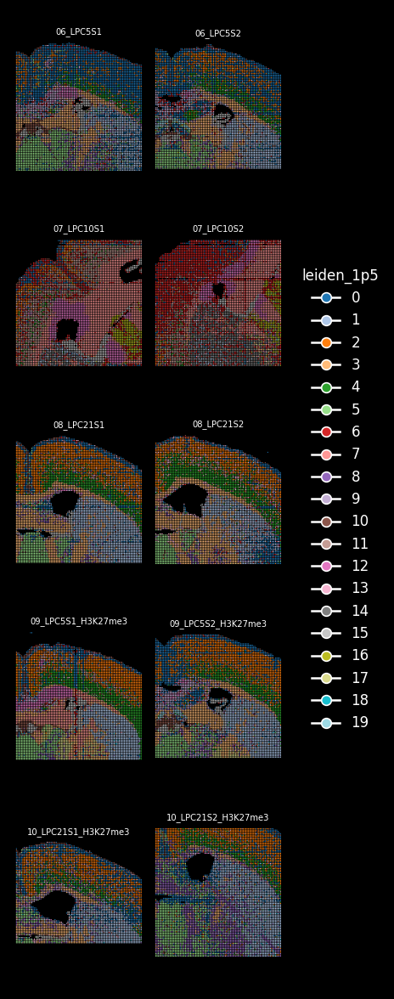

In [18]:
# usage
plot_spatial_compact_fast(
    ad_sub,
    color="leiden_1p5",
    groupby="sample_id",
    spot_size=0.5,
    cols=2,
    height=10,
    legend_col_width=1.0,
    background="black",
    grey_alpha=0.05,
    #highlight=['4','5']
);

In [19]:
# Ensure all layers are sparse CSR matrices
from scipy.sparse import csr_matrix, issparse

for name, layer in list(ad_sub.layers.items()):
    if not issparse(layer):
        ad_sub.layers[name] = csr_matrix(layer)

# Optional: verify
{k: type(v).__name__ for k, v in ad_sub.layers.items()}


{'counts': 'csr_matrix'}

In [ ]:

sc.pp.highly_variable_genes(
    ad_sub,
    n_top_genes=500,     # try 1500–2000
    flavor="seurat_v3"
)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [21]:
ad_sub_s = ad_sub[:, ad_sub.var["highly_variable"]].copy()

In [22]:
scvi.model.SCVI.setup_anndata(
    ad_sub_s, 
    layer="counts", 
    batch_key='sample_id',
)

model = scvi.model.SCVI(ad_sub_s)

In [23]:
model.train(early_stopping=True, max_epochs = 30, enable_progress_bar=True)

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores


Epoch 30/30: 100%|██████████| 30/30 [02:39<00:00,  5.45s/it, v_num=1, train_loss_step=11.8, train_loss_epoch=11.9]

`Trainer.fit` stopped: `max_epochs=30` reached.


Epoch 30/30: 100%|██████████| 30/30 [02:39<00:00,  5.33s/it, v_num=1, train_loss_step=11.8, train_loss_epoch=11.9]


In [24]:
# Get scVI latent representation
ad_sub.obsm['X_scVI'] = model.get_latent_representation()

print(f"Added X_scVI to ad_sub.obsm with shape: {ad_sub.obsm['X_scVI'].shape}")

Added X_scVI to ad_sub.obsm with shape: (83233, 10)


In [25]:
import squidpy as sq

# Build spatial graph
# This should be done per-sample to avoid creating edges between samples
sq.gr.spatial_neighbors(
    ad_sub,
    coord_type='generic',
    delaunay=True,  # Delaunay triangulation (connects nearby cells)
    key_added='spatial',
    library_key='sample_id'  # Ensure no edges between different samples,
)

print(f"Spatial graph built: {ad_sub.obsp['spatial_connectivities'].shape}")
print(f"Average neighbors per cell: {ad_sub.obsp['spatial_connectivities'].sum(axis=1).mean():.1f}")

Spatial graph built: (83233, 83233)
Average neighbors per cell: 5.9


In [26]:
import cellcharter as cc

In [27]:
cc.gr.remove_long_links(ad_sub)

In [28]:
# Run MANA with memory-efficient per-sample processing
# Adjust 'sample_key' to match your actual sample column name!

aggregate_neighbors_weighted(
    ad_sub,
    n_layers=3,              # Optimal balance (from MANA-5)
    aggregations='mean',     # Standard aggregation
    use_rep='X_scVI',        # Use scVI latent space
    out_key='X_mana_gauss',  # Output key
    hop_decay=0.2,           # Optimal decay (from MANA-4)
    distance_kernel='gaussian',  # Winner from MANA-6 benchmark
    spatial_key='spatial',
    normalize_weights=True,
    include_self=True,
    sample_key='sample_name_updated',  # CRITICAL: Process per-sample to avoid memory issues!
)

print("\nMANA aggregation complete!")
print(f"Output stored in adata.obsm['X_mana_gauss'] with shape: {ad_sub.obsm['X_mana_gauss'].shape}")

TypeError: 'module' object is not callable

In [ ]:
# GMM components to try
# GMM components to try
gmm_components = [5,8,10,12,15,20]



In [ ]:
from sklearn.mixture import GaussianMixture
import pandas as pd

X = ad_sub.obsm['X_mana_gauss']
gmm_results = []

for k in gmm_components:
    gmm = GaussianMixture(
        n_components=k,
        covariance_type='full',
        random_state=0,
        n_init=3,
    )
    labels = gmm.fit_predict(X)
    key = f'gmm_mana_{k}'
    ad_sub.obs[key] = labels.astype(str)
    gmm_results.append({
        'k': k,
        'bic': gmm.bic(X),
        'aic': gmm.aic(X),
    })
    n_clusters = ad_sub.obs[key].nunique()
    print(f'k={k}: {n_clusters} clusters')

gmm_scores = pd.DataFrame(gmm_results).sort_values('bic')
best_k = int(gmm_scores.iloc[0]['k'])
gmm_best_key = f'gmm_mana_{best_k}'
print(f'Best k by BIC: {best_k} -> {gmm_best_key}')


k=30: 30 clusters
Best k by BIC: 30 -> gmm_mana_30


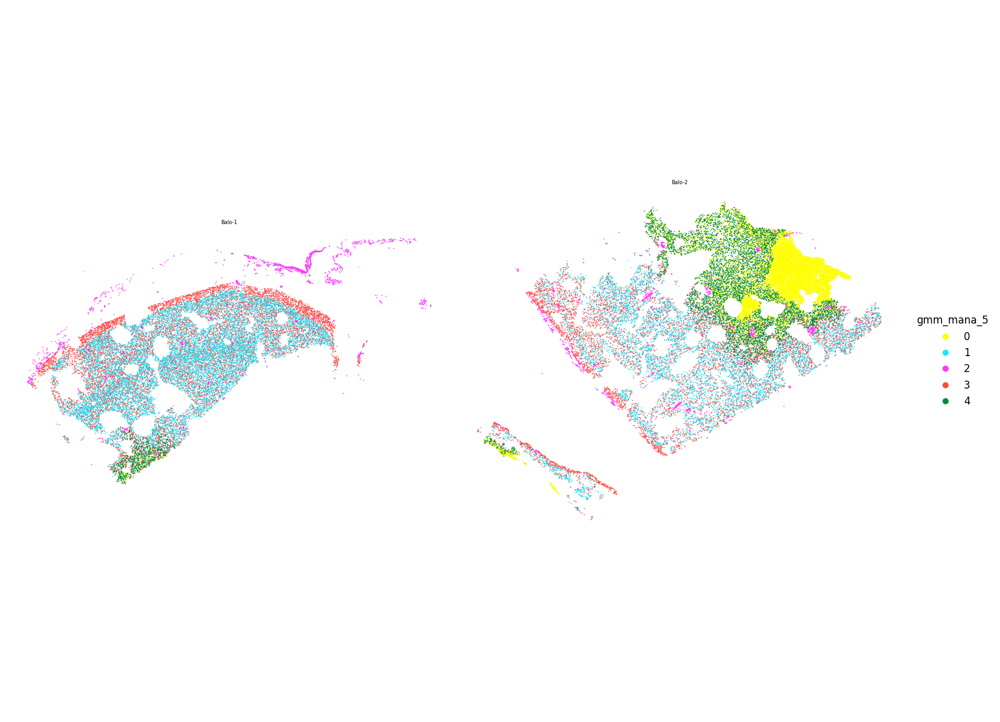

In [ ]:
# Visualize GMM clustering (best k by BIC)
plot_spatial_compact_fast(
    ad_sub,
    color="gmm_mana_5",
    groupby='sample_id',  # Adjust to your actual sample column
    spot_size=1,
    cols=2,
    height=10,
    background='white',
    dpi=120,
)


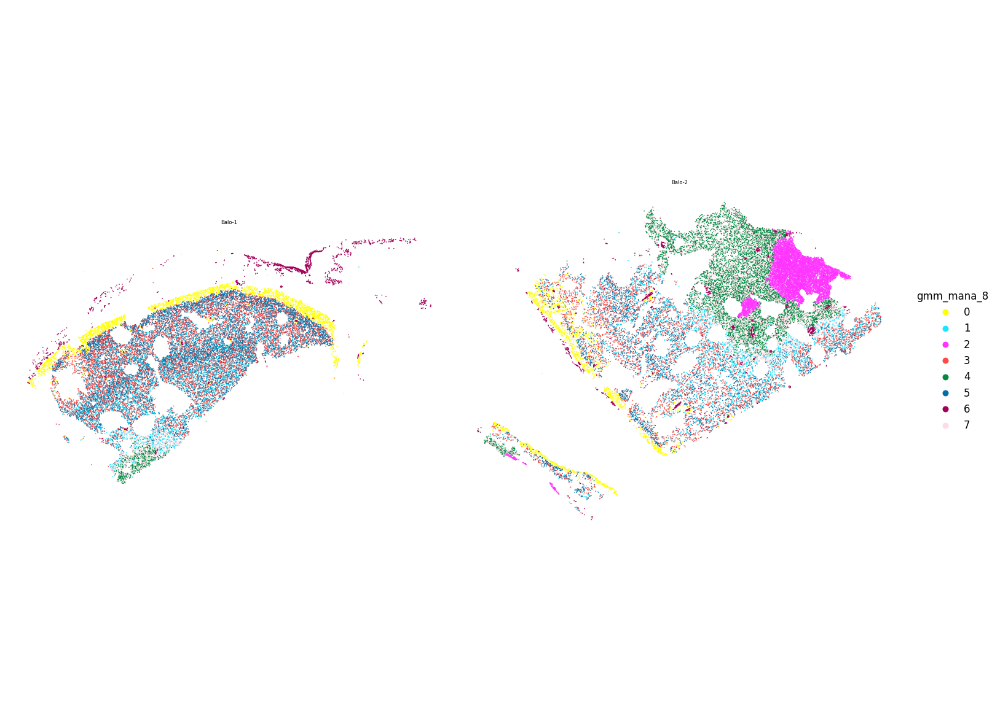

In [38]:
# Visualize GMM clustering (best k by BIC)
plot_spatial_compact_fast(
    ad_sub,
    color="gmm_mana_8",
    groupby='sample_id',  # Adjust to your actual sample column
    spot_size=1,
    cols=2,
    height=10,
    background='white',
    dpi=120,
)


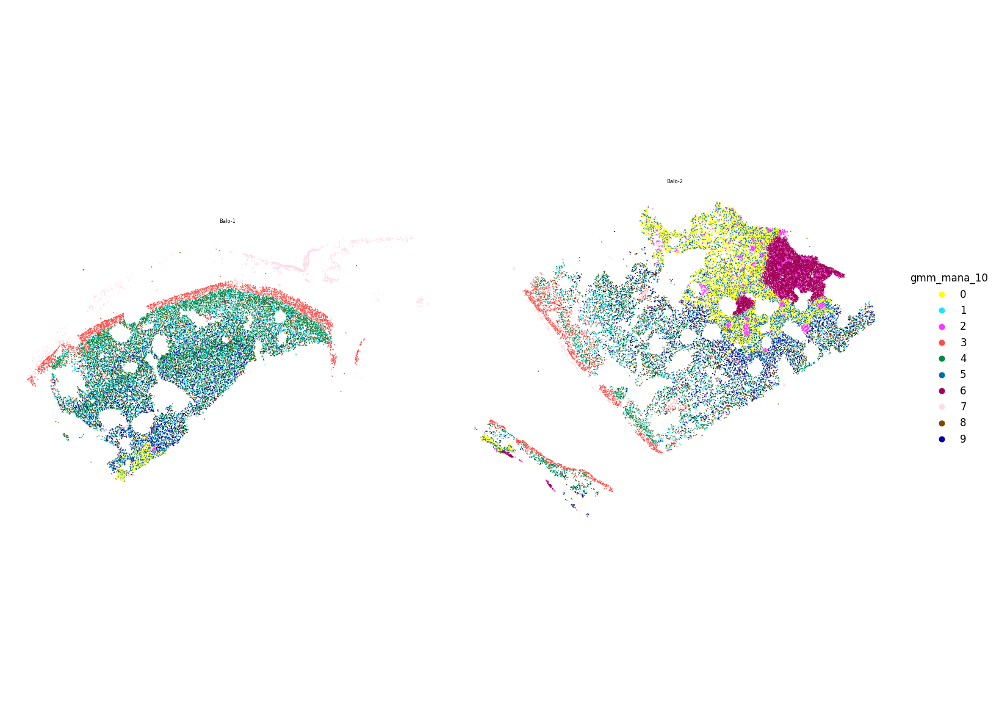

In [39]:
# Visualize GMM clustering (best k by BIC)
plot_spatial_compact_fast(
    ad_sub,
    color="gmm_mana_10",
    groupby='sample_id',  # Adjust to your actual sample column
    spot_size=1,
    cols=2,
    height=10,
    background='white',
    dpi=120,
)


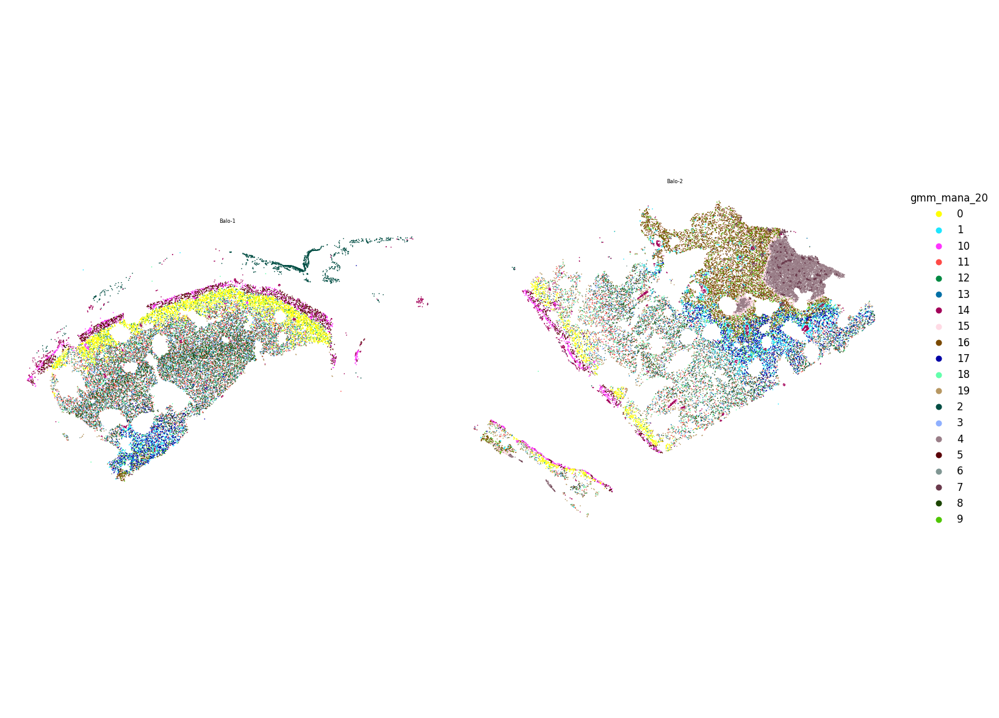

In [40]:
# Visualize GMM clustering (best k by BIC)
plot_spatial_compact_fast(
    ad_sub,
    color=gmm_key,
    groupby='sample_id',  # Adjust to your actual sample column
    spot_size=1,
    cols=2,
    height=10,
    background='white',
    dpi=120,
)


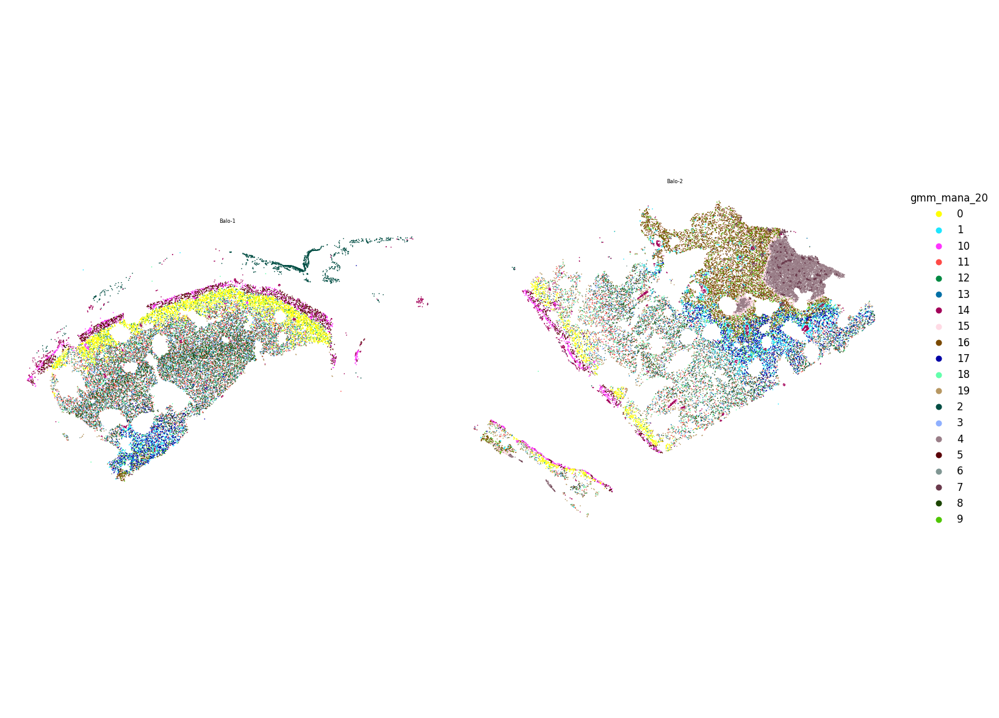

In [41]:
# Visualize alternative GMM clustering (largest k in gmm_components)
plot_spatial_compact_fast(
    ad_sub,
    color=gmm_alt_key,
    groupby='sample_id',  # Adjust to your actual sample column
    spot_size=1,
    cols=2,
    height=10,
    background='white',
    dpi=120,
)


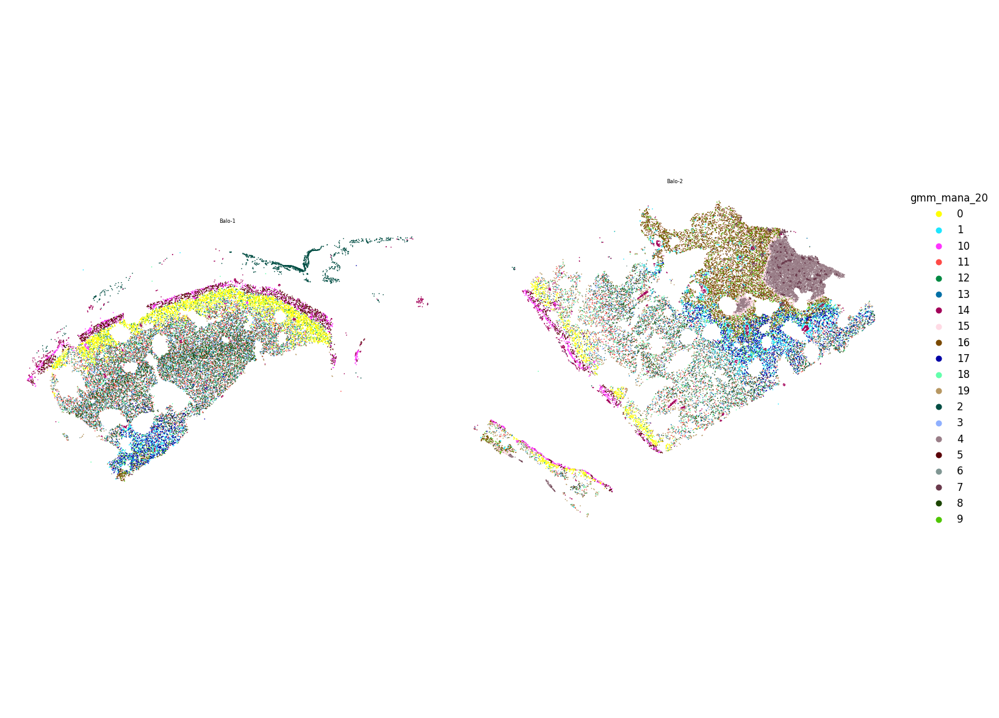

In [45]:
# Visualize GMM clustering (best k by BIC)
plot_spatial_compact_fast(
    ad_sub,
    color="gmm_mana_20",
    groupby='sample_id',  # Adjust to your actual sample column
    spot_size=1,
    cols=2,
    height=10,
    background='white',
    dpi=120,
)


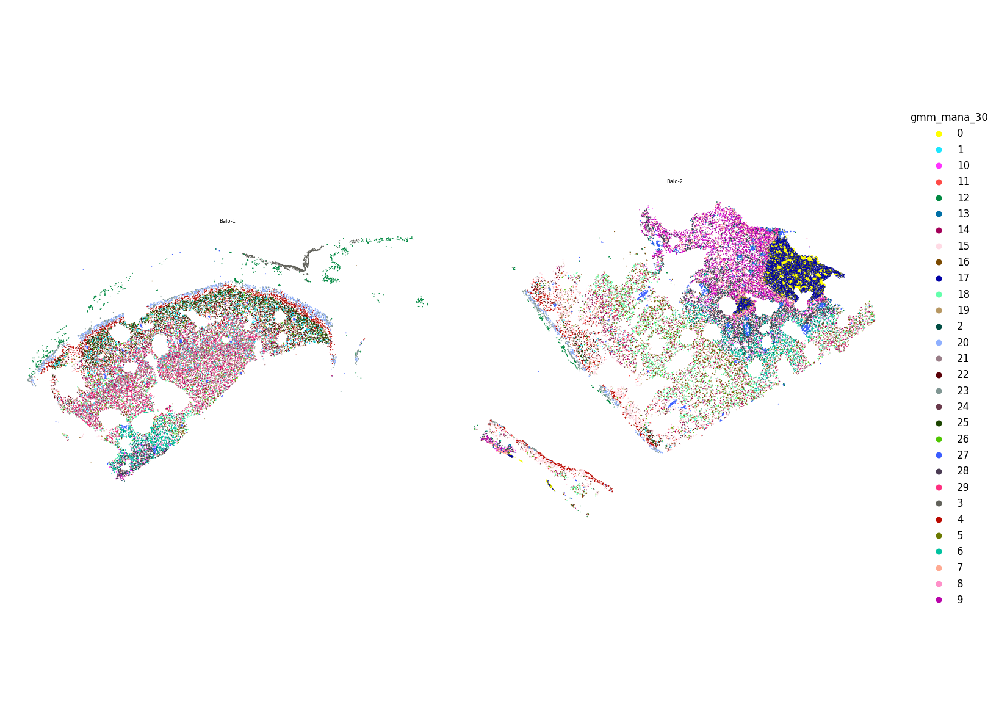

In [46]:
# Visualize GMM clustering (best k by BIC)
plot_spatial_compact_fast(
    ad_sub,
    color="gmm_mana_30",
    groupby='sample_id',  # Adjust to your actual sample column
    spot_size=1,
    cols=2,
    height=10,
    background='white',
    dpi=120,
)


In [48]:
# Compute highly variable genes (do not subset)
sc.pp.highly_variable_genes(
    adata=ad_sub,
    n_top_genes=200,
    flavor='seurat_v3',
    subset=False,
)
ad_sub.var['highly_variable'].value_counts()


highly_variable
False    4707
True      200
Name: count, dtype: int64

In [49]:
ad_sub.write('../../data/baloMS-nuclei-clustered-balo.h5ad')

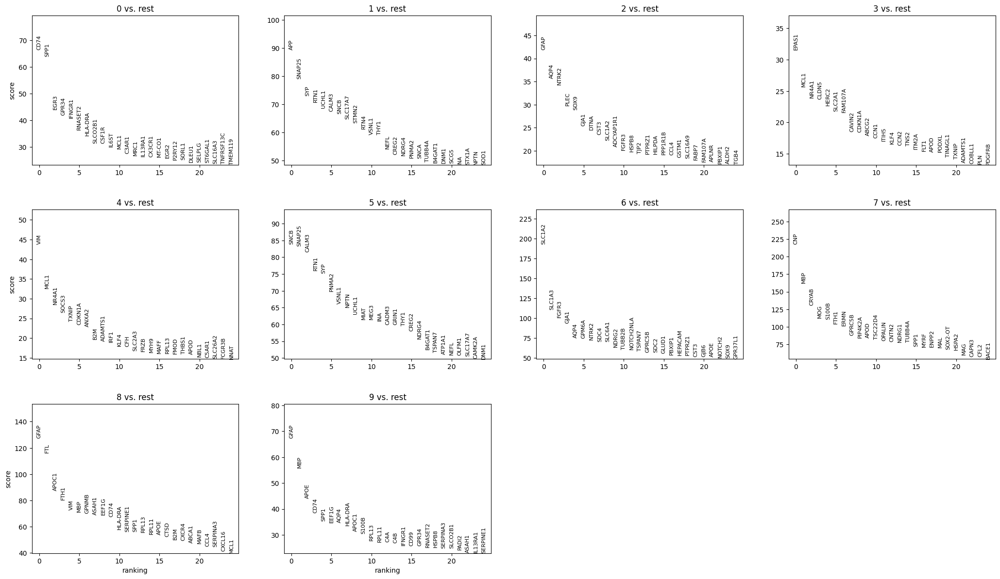

0
CD74 SPP1 EGR3 GPR34 IFNGR1 RNASET2 HLA-DRA SLCO2B1 CSF1R IL6ST MCL1 C3AR1 MRC1 IL13RA1 CX3CR1 MT-CO1 EGR2 P2RY12 SORL1 DLEU1 SELPLG ST6GAL1 SLC16A3 TNFRSF13C TMEM119 ARRB2 HLA-DRB1 SERPINE1 CCL4 CD302
 
1
APP SNAP25 SYP RTN1 UCHL1 CALM3 SNCB SLC17A7 STMN2 RTN4 VSNL1 THY1 NEFL CREG2 NDRG4 PNMA2 SNCA TUBB4A B4GAT1 DNM1 SCG5 INA STX1A NPTN SOD1 GRIN1 MAP2K1 ATP1A1 RGS4 NRN1
 
2
GFAP AQP4 NTRK2 PLEC SOX9 GJA1 DTNA CST3 SLC1A2 ADCYAP1R1 FGFR3 HSPB8 TJP2 PTPRZ1 HILPDA PPP1R1B CCL4 GSTM1 SLC16A9 FABP7 FAM107A APLNR PBXIP1 ALDH2 ITGB4 NDRG2 OSGIN2 FADS2 GSTM3 PON2
 
3
EPAS1 MCL1 NR4A1 CLDN5 HERC2 SLC2A1 FAM107A CAVIN2 CDKN1A ABCG2 CCN1 ITIH5 KLF4 CCN2 TNS2 ITM2A FLT1 APOD PODXL TINAGL1 TXNIP ADAMTS1 COBLL1 PLN PDGFRB NEDD9 MYH9 RGS5 TBX2 CD34
 
4
VIM MCL1 NR4A1 SOCS3 TXNIP CDKN1A ANXA2 B2M ADAMTS1 IRF1 KLF4 CFH SLC2A3 FRZB MYH9 MAFF RPL13 FMOD THBS1 APOD NBL1 C5AR1 SLC26A2 FCGR3B NNAT FOXC1 CCN1 KDR ZIC2 PHLDB2
 
5
SNCB SNAP25 CALM3 RTN1 SYP PNMA2 VSNL1 NPTN UCHL1 MIAT MEG3 INA CADM3 GRIN1 

In [54]:
import pandas as pd
key = 'gmm_mana_10'  # <-- change to your cluster column if needed

sc.tl.rank_genes_groups(
    ad_sub,
    groupby=key,
    reference='rest',             # each group vs all other cells
    method='t-test',
    pts=True,                     # add fraction expressing
)
sc.pl.rank_genes_groups(ad_sub, n_genes=25, sharey=False)

marker_genes = pd.DataFrame({
    group: ad_sub.uns['rank_genes_groups']['names'][group][:30]
    for group in ad_sub.uns['rank_genes_groups']['names'].dtype.names
})
for col in marker_genes.columns:
    print(col)
    genes = marker_genes[col].tolist()

    print(' '.join(genes))
    print(' ')


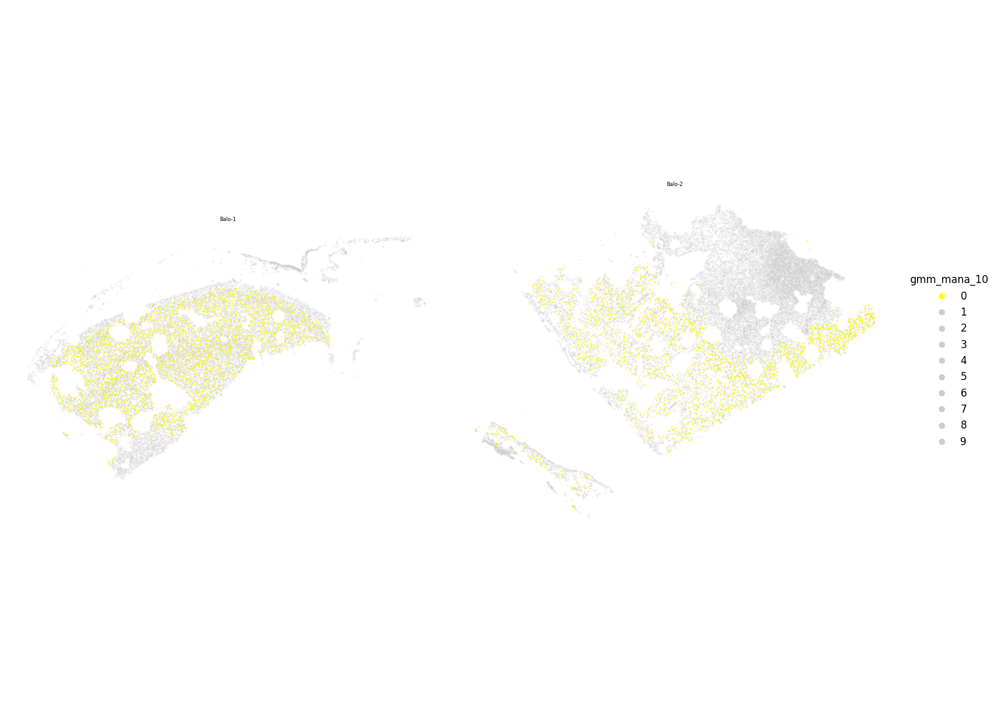

0
CD74 SPP1 EGR3 GPR34 IFNGR1 RNASET2 HLA-DRA SLCO2B1 CSF1R IL6ST MCL1 C3AR1 MRC1 IL13RA1 CX3CR1 MT-CO1 EGR2 P2RY12 SORL1 DLEU1 SELPLG ST6GAL1 SLC16A3 TNFRSF13C TMEM119 ARRB2 HLA-DRB1 SERPINE1 CCL4 CD302
 


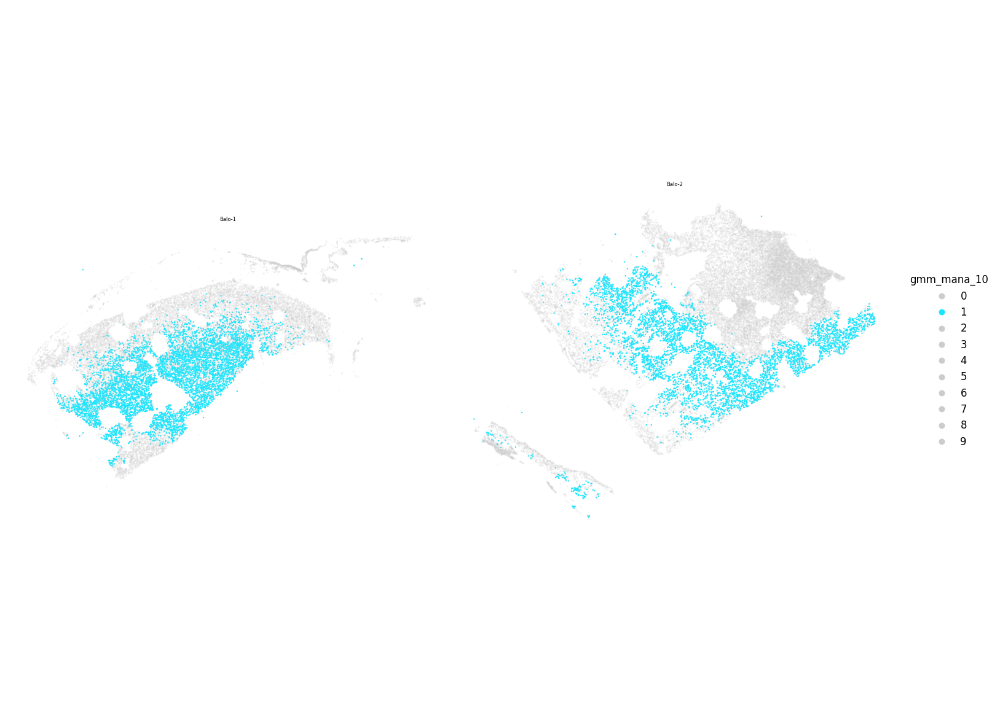

1
APP SNAP25 SYP RTN1 UCHL1 CALM3 SNCB SLC17A7 STMN2 RTN4 VSNL1 THY1 NEFL CREG2 NDRG4 PNMA2 SNCA TUBB4A B4GAT1 DNM1 SCG5 INA STX1A NPTN SOD1 GRIN1 MAP2K1 ATP1A1 RGS4 NRN1
 


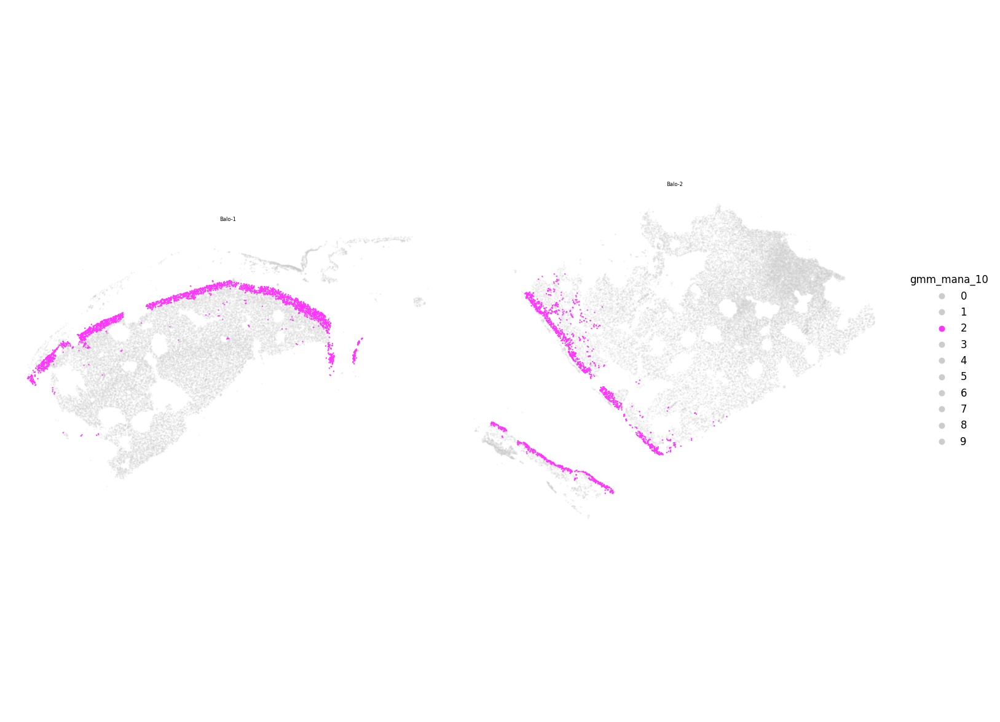

2
GFAP AQP4 NTRK2 PLEC SOX9 GJA1 DTNA CST3 SLC1A2 ADCYAP1R1 FGFR3 HSPB8 TJP2 PTPRZ1 HILPDA PPP1R1B CCL4 GSTM1 SLC16A9 FABP7 FAM107A APLNR PBXIP1 ALDH2 ITGB4 NDRG2 OSGIN2 FADS2 GSTM3 PON2
 


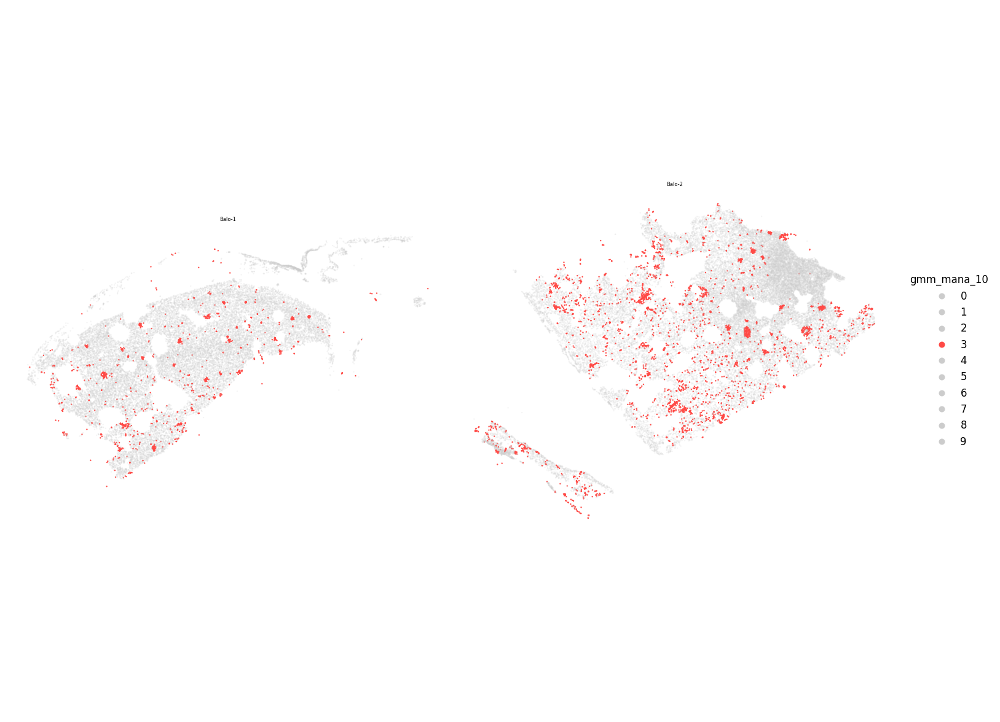

3
EPAS1 MCL1 NR4A1 CLDN5 HERC2 SLC2A1 FAM107A CAVIN2 CDKN1A ABCG2 CCN1 ITIH5 KLF4 CCN2 TNS2 ITM2A FLT1 APOD PODXL TINAGL1 TXNIP ADAMTS1 COBLL1 PLN PDGFRB NEDD9 MYH9 RGS5 TBX2 CD34
 


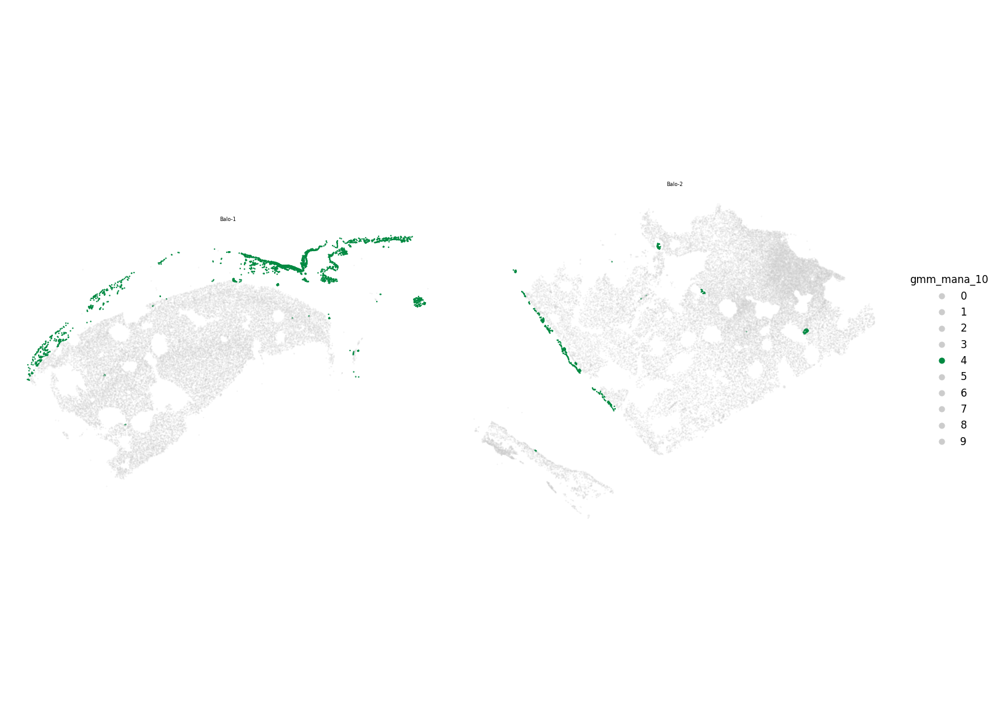

4
VIM MCL1 NR4A1 SOCS3 TXNIP CDKN1A ANXA2 B2M ADAMTS1 IRF1 KLF4 CFH SLC2A3 FRZB MYH9 MAFF RPL13 FMOD THBS1 APOD NBL1 C5AR1 SLC26A2 FCGR3B NNAT FOXC1 CCN1 KDR ZIC2 PHLDB2
 


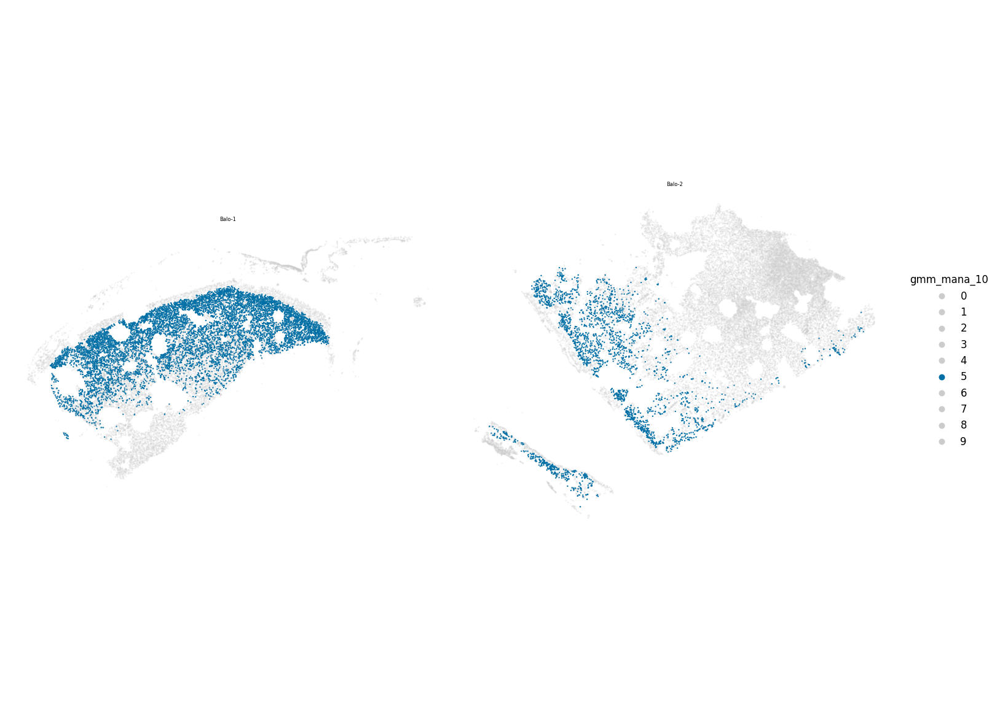

5
SNCB SNAP25 CALM3 RTN1 SYP PNMA2 VSNL1 NPTN UCHL1 MIAT MEG3 INA CADM3 GRIN1 THY1 CREG2 NDRG4 B4GAT1 TSPAN7 ATP1A1 NEFL OLFM1 SLC17A7 CAMK2A DNM1 NORAD NAP1L5 TMEM130 STMN2 CLSTN1
 


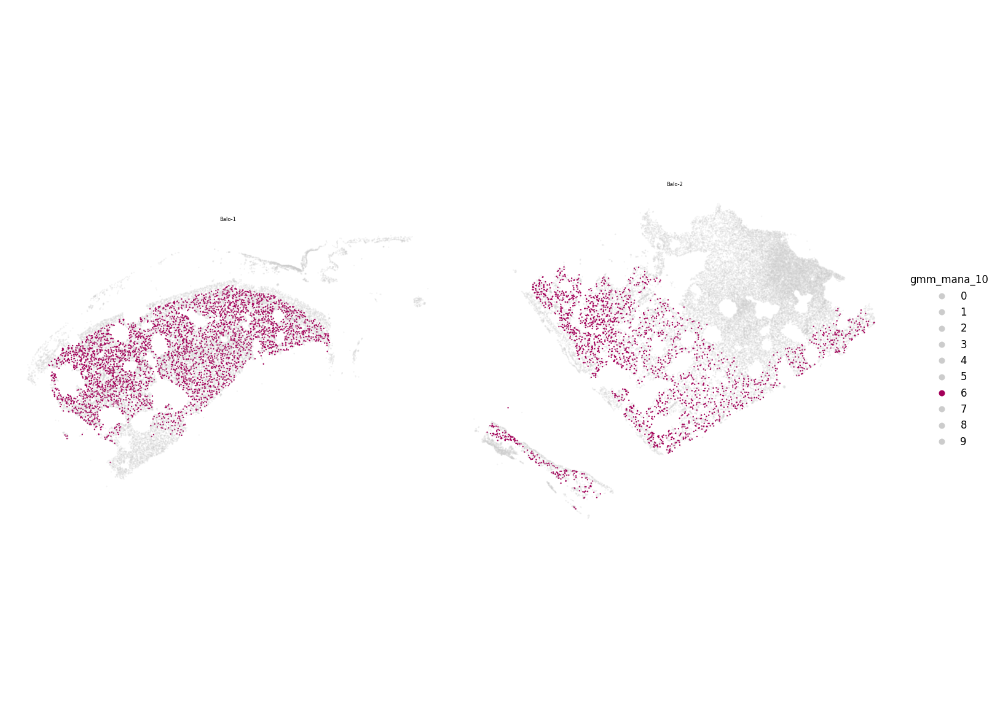

6
SLC1A2 SLC1A3 FGFR3 GJA1 AQP4 GPM6A NTRK2 SDC4 SLC6A1 NDRG2 TUBB2B NOTCH2NLA TSPAN7 GPRC5B SDC2 GLUD1 PBXIP1 HEPACAM PTPRZ1 CST3 GJB6 APOE NOTCH2 SOX9 GPR37L1 DKK3 HTRA1 DTNA SOX2 BMP7
 


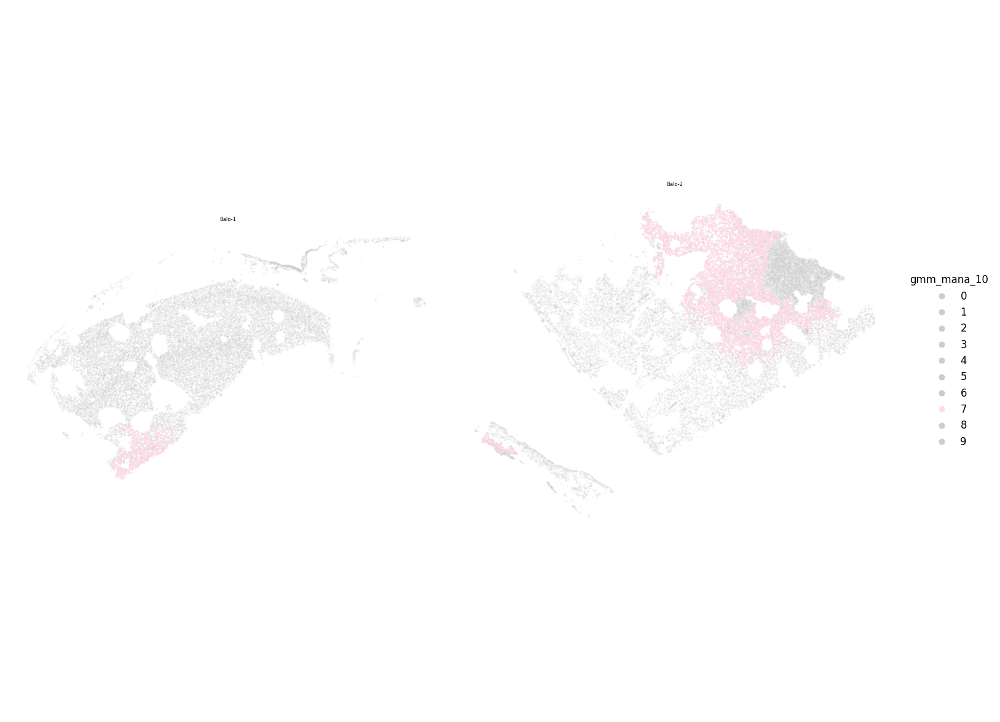

7
CNP MBP CRYAB MOG S100B FTH1 ERMN GPRC5B PIP4K2A APOD TSC22D4 OPALIN CNTN2 NDRG1 TUBB4A SPP1 MYRF ENPP2 MAL SOX2-OT HSPA2 MAG CAPN3 CFL2 BACE1 SOX10 TPPP MOBP SPOCK1 SEMA4D
 


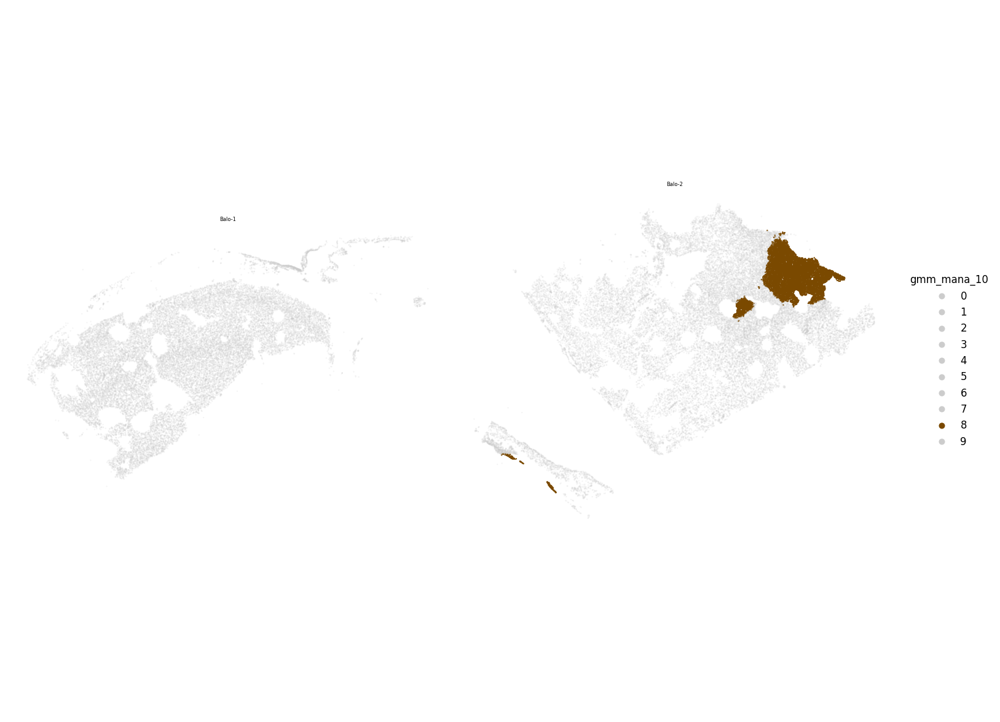

8
GFAP FTL APOC1 FTH1 VIM MBP GPNMB ASAH1 EEF1G CD74 HLA-DRA SERPINE1 SPP1 RPL13 RPL11 APOE CTSD B2M CXCR4 ABCA1 MAFB CCL4 SERPINA3 CXCL16 MCL1 FCGR2A ANXA5 SLCO2B1 LIPA CREG1
 


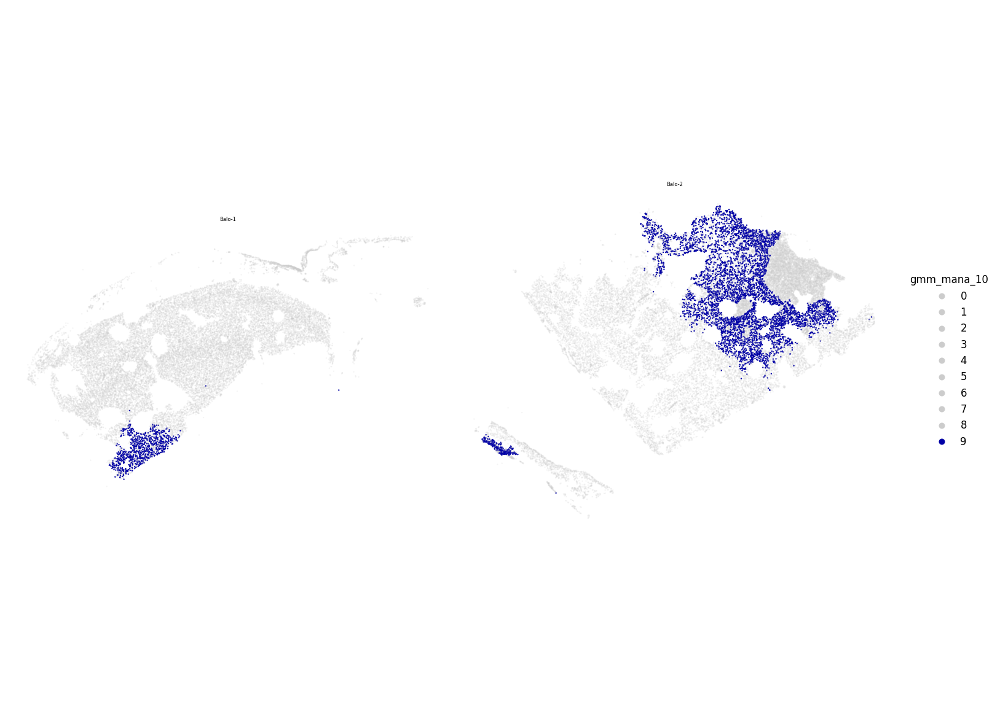

9
GFAP MBP APOE CD74 SPP1 EEF1G AQP4 HLA-DRA APOC1 S100B RPL13 RPL11 C4A C4B IFNGR1 CD99 GPR34 RNASET2 HSPB8 SERPINA3 SLCO2B1 PADI2 ASAH1 IL13RA1 SERPINE1 EGR3 BCAN CSF1R PTPRZ1 SORL1
 


In [55]:
for cluster in sorted(ad_sub.obs.gmm_mana_10.unique().astype(int)):
    plot_spatial_compact_fast(
        ad_sub,
        color="gmm_mana_10",
        groupby="sample_id",
        spot_size=2,
        cols=2,
        height=10,
        legend_col_width=1.0,
        highlight=[cluster]
    )
    print(cluster)
    genes = marker_genes[str(cluster)].tolist()
    print(" ".join(genes))
    print(' ')